In [15]:
import numpy as np

filename = "dataset/trainData.txt"

numFeatures = 6

In [16]:
def loadDataSet(path):
    rawData = np.genfromtxt(path, delimiter=',', dtype = "str")

    #extract the 6 feature for each footprint
    features = rawData[:, 0:numFeatures]
    features = np.array(features, dtype= np.float64).T

    #extract the labels: 1->True, 0->False
    labels = rawData[:, -1]
    labels = np.array(labels, dtype=np.int16)

    return features, labels



In [17]:
features, labels = loadDataSet(filename)

print(f"features shape: {features.shape}\nLabels shape: {labels.shape}")

features shape: (6, 6000)
Labels shape: (6000,)


features: columns are samples, rows are the 6 features

In [18]:
features[:, :10] #feature 0 to 5, first 10 samples

array([[ 1.85284048, -0.21530775,  0.04653456, -0.69846824, -2.13449634,
        -0.18678977,  0.37954862,  0.25194121,  1.02611325,  0.12159774],
       [-0.16436898,  1.63665974, -1.16487257, -0.7313877 , -0.94679643,
        -0.35105166,  0.07035488, -0.536285  ,  0.84958757, -0.44862065],
       [ 1.09839078, -0.61831145,  0.04392191,  0.22682514,  0.7331265 ,
         0.25874009,  0.74192792,  0.98317697, -0.34210771, -0.26330183],
       [-0.93073689,  0.99002204, -0.41369086,  0.1487948 , -3.50433306,
         0.82430276,  0.21831212, -1.43683554,  0.84965311, -0.31580565],
       [-1.0193342 ,  0.38670252, -1.08847926, -1.44462156, -1.82338742,
        -1.24295012,  1.30277214,  0.74408647,  0.12493949,  1.42245348],
       [ 1.16696309,  1.15926273, -1.37988988,  1.17573859,  0.90464917,
        -0.09511962, -1.32719263,  1.43401058,  0.69336959, -1.00038176]])

## Features normalization 

In [19]:
#Compute mean
mu = features.mean(axis=1) #shape is (6, )

print(f"Mu before reshaping: {mu}\n")
#Reshape the mean to subtract it to the features
mu = mu.reshape((mu.shape[0], 1))   #(6, 1)

print(f"Mu after reshaping:\n {mu}\n")

Mu before reshaping: [ 0.00170711  0.00503903 -0.00560753  0.00109537 -0.00700025  0.00910515]

Mu after reshaping:
 [[ 0.00170711]
 [ 0.00503903]
 [-0.00560753]
 [ 0.00109537]
 [-0.00700025]
 [ 0.00910515]]



In [20]:
#Std Dev
std = features.std(1)

std.shape

(6,)

In [21]:
print(f"Features shape: {features.shape}\nMu shape: {mu.shape}\nStd shape: {std.shape}")

Features shape: (6, 6000)
Mu shape: (6, 1)
Std shape: (6,)


In [22]:
#I have to reshape the std!
std = std.reshape((std.shape[0], 1))
std.shape

(6, 1)

In [23]:
#Normalization

normalizedFeatures = (features - mu) / std

print(f"Shape of normaliized features: {normalizedFeatures.shape}\nShape of original features:{features.shape}")
print(f"Mean:\n {mu}\n Std:\n {std}")


#show all the 6 features for sample 0, before and after normalzation
print(f"features, sample0 before norm: {features[:, 0]}\nfeature, sample0 after norm: {normalizedFeatures[:, 0]}") 

Shape of normaliized features: (6, 6000)
Shape of original features:(6, 6000)
Mean:
 [[ 0.00170711]
 [ 0.00503903]
 [-0.00560753]
 [ 0.00109537]
 [-0.00700025]
 [ 0.00910515]]
 Std:
 [[1.00067129]
 [0.99917601]
 [1.00124013]
 [0.99513511]
 [1.00059856]
 [0.99861091]]
features, sample0 before norm: [ 1.85284048 -0.16436898  1.09839078 -0.93073689 -1.0193342   1.16696309]
feature, sample0 after norm: [ 1.84989155 -0.16954771  1.1026309  -0.93638768 -1.01172838  1.15946855]


## Normalized, density histrograms

In [24]:
labels

array([1, 0, 1, ..., 1, 0, 0], shape=(6000,), dtype=int16)

In [25]:
import matplotlib.pyplot as plt

def densityFeaturePlots(x, y):
    labelColors = {0: "red", 1: "#00ff00"}
    classLabels = {0: 'False', 1: 'True'}

    for i in range(numFeatures):
        plt.figure(figsize=(6,4))
        for label in labelColors:
            sample_with_that_class = x[i][ y == label]  #select for feature i all the samples with class == label
            
            plt.hist(x=sample_with_that_class, color=labelColors[label], alpha= 0.7, linewidth = 0.3, density=True, label=f"{classLabels[label]}", edgecolor="black", bins=100)
            plt.legend()  # legend

        plt.title(f"Feature {i} Distribution")
        plt.xlabel(f"Feature {i}")
        plt.ylabel("Density")
        plt.show()

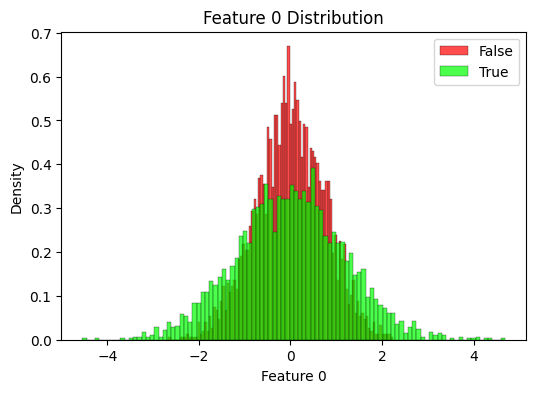

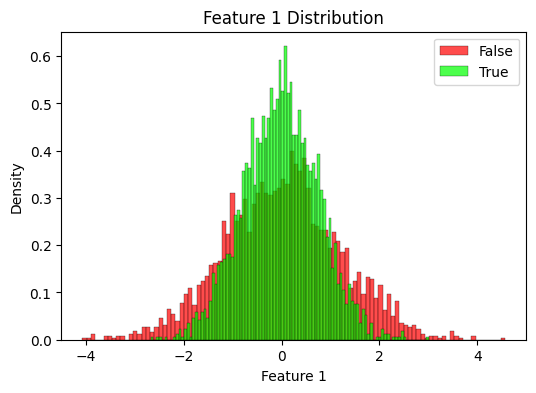

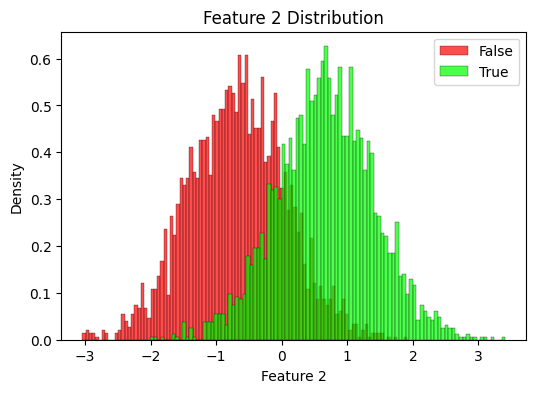

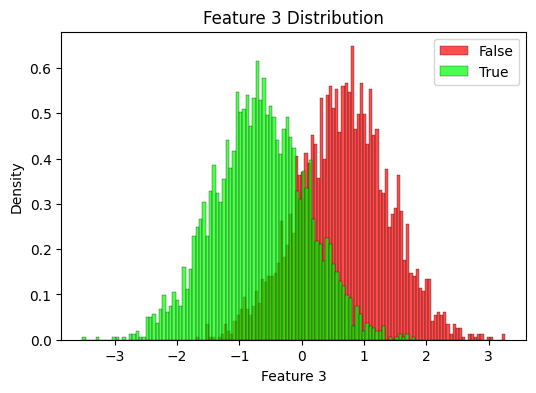

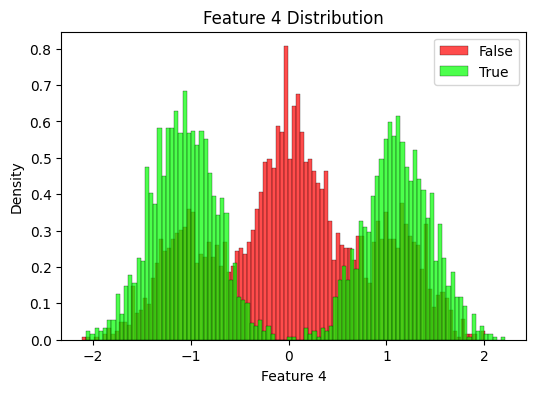

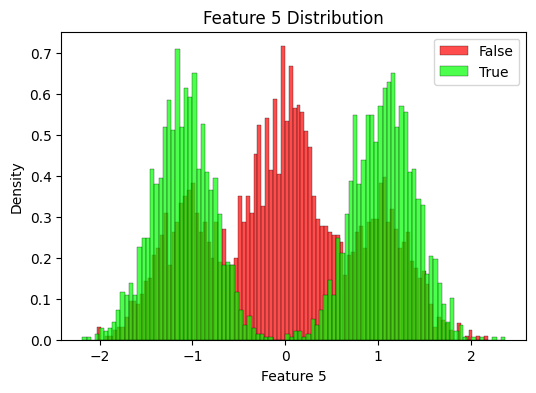

In [26]:
#Plot histograms
x = normalizedFeatures
y = labels
densityFeaturePlots(x, y)

## Scatter plots of pair of features

In [27]:
def scatterPlots(x, y):
    #I select feature i and feature j, with i different from j and plot them on the 2 axis of every scatter plot chart

    #rows, cols for making the subplot
    cols = 6
    rows = 6

    labelColors = {0: "red", 1: "#00ff00"}
    classLabels = {0: 'False', 1: 'True'}

    #subplot creation
    fig, plots = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*6, rows*4))
    plots = plots.flatten()   #the 2D axes array becomes a 1D array in order to access each ax in a more straighforward way during the loop

    subplotCounter = 0
    for i in range(numFeatures):
        for j in range(numFeatures):
            if j == i: continue

            #choose the subplot
            subplot = plots[subplotCounter]
            subplotCounter+=1

            #plt.scatter accepts x and y vectors
            for label in labelColors:
                xFeature = x[i][ y == label]
                yFeature = x[j][ y == label]
                subplot.scatter(xFeature, yFeature, color= labelColors[label], alpha=0.4,  label=f"{classLabels[label]}", edgecolor="black")

            subplot.set_xlabel(f"Feature {i}")
            subplot.set_ylabel(f"Feature {j}")
            subplot.legend()
            subplot.set_title(f"Scatter plot: Feature {i} vs Feature {j}")

        subplot = plots[subplotCounter]
        subplotCounter+=1
        for label in labelColors:
            sample_with_that_class = x[i][ y == label]
            subplot.hist(x=sample_with_that_class, color=labelColors[label], alpha= 0.7, density=True, label=f"{classLabels[label]}", edgecolor="black")
            subplot.legend()
            subplot.set_title(f"Feature {i} Distribution")
            subplot.set_xlabel(f"Feature {i}")
            subplot.set_ylabel("Density")

    plt.tight_layout(pad=3) #add padding between subplots to distance between eachother
    plt.show()

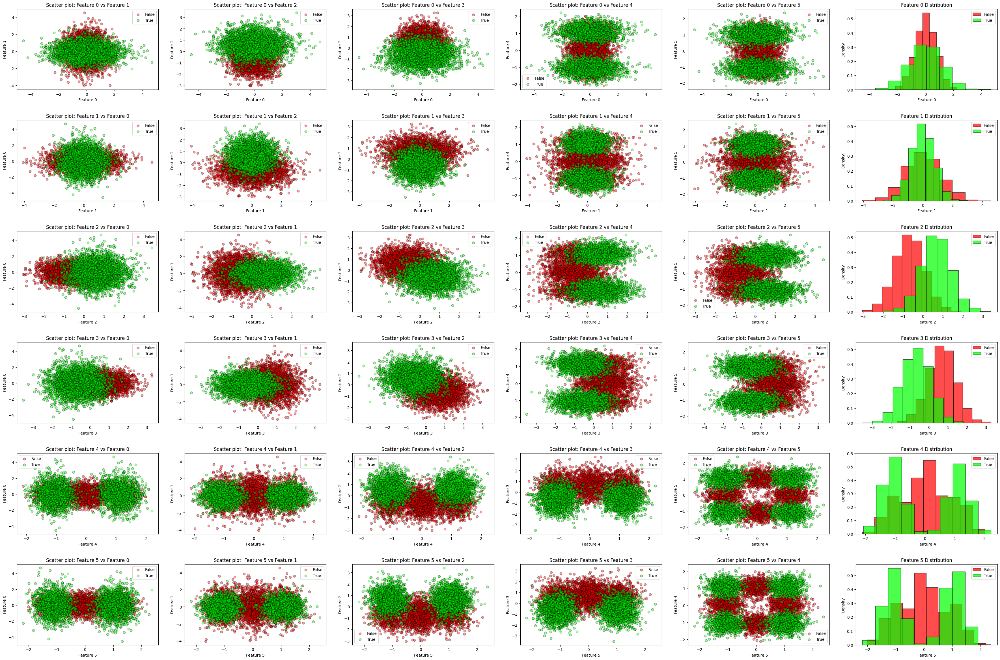

In [28]:
scatterPlots(x, y)

## Correlation between the first 2 features

In [29]:
def scatterPlotsFirst2Features(x, y):
    #I select feature i and feature j, with i different from j and plot them on the 2 axis of every scatter plot chart

    #rows, cols for making the subplot
    cols = 2
    rows = 2

    labelColors = {0: "red", 1: "#00ff00"}
    classLabels = {0: 'False', 1: 'True'}

    #subplot creation
    fig, plots = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*6, rows*4))
    plots = plots.flatten()   #the 2D axes array becomes a 1D array in order to access each ax in a more straighforward way during the loop

    subplotCounter = 0
    for i in range(2):
        for j in range(2):
            if j == i: continue

            #choose the subplot
            subplot = plots[subplotCounter]
            subplotCounter+=1

            #plt.scatter accepts x and y vectors
            for label in labelColors:
                xFeature = x[i][ y == label]
                yFeature = x[j][ y == label]
                subplot.scatter(xFeature, yFeature, color= labelColors[label], alpha=0.4,  label=f"{classLabels[label]}", edgecolor="black")

            subplot.set_xlabel(f"Feature {i}")
            subplot.set_ylabel(f"Feature {j}")
            subplot.legend()
            subplot.set_title(f"Scatter plot: Feature {i} vs Feature {j}")

        subplot = plots[subplotCounter]
        subplotCounter+=1
        for label in labelColors:
            sample_with_that_class = x[i][ y == label]
            subplot.hist(x=sample_with_that_class, color=labelColors[label], alpha= 0.7, density=True, label=f"{classLabels[label]}", edgecolor="black")
            subplot.legend()
            subplot.set_title(f"Feature {i} Distribution")
            subplot.set_xlabel(f"Feature {i}")
            subplot.set_ylabel("Density")

    plt.tight_layout(pad=3) #add padding between subplots to distance between eachother
    plt.show()

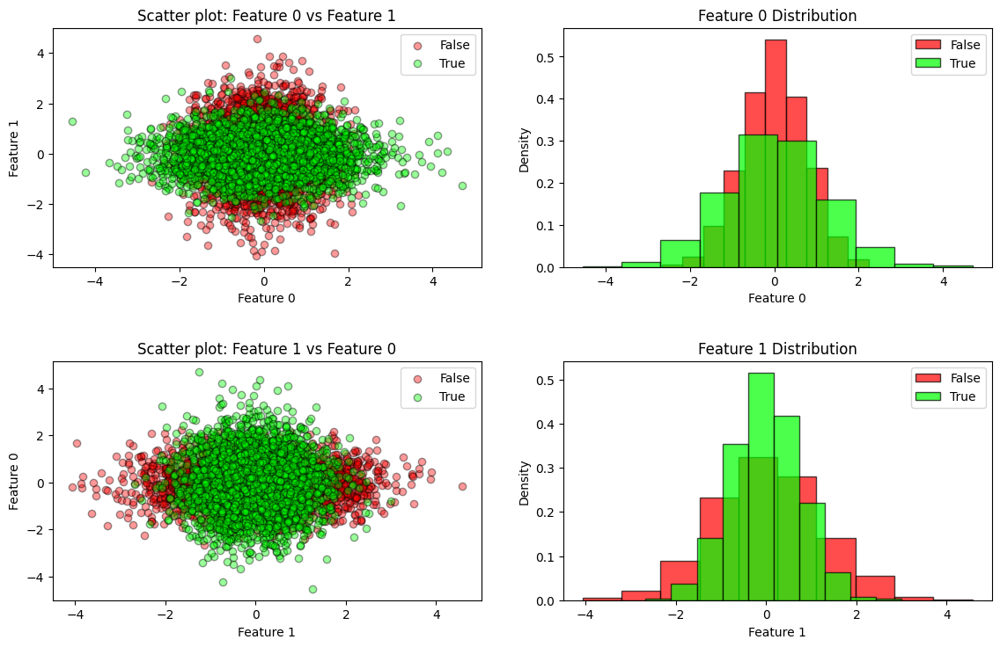

In [30]:
scatterPlotsFirst2Features(x, y)

## Difference between Covariance Matrix and Correlation Matrix
The Covariance Matrix is calculated as: <br> ```Cov = (features @ features.T) / float(features.shape[1])``` <br> because the features are **not** normalized <br>
The Correlation Matrix is calculated as: <br> ```Corr = (normalizedFeatures @ normalizedFeatures.T) / float(normalizedFeatures.shape[1])``` <br> Here the features are **normalized**!

In [31]:
# Correlation Matrix with the mathematical formula
C = (normalizedFeatures @ normalizedFeatures.T) / float(normalizedFeatures.shape[1])
C

array([[ 1.00000000e+00,  5.16835023e-03,  1.76409036e-03,
         1.45880999e-02,  9.99398418e-03, -1.29684448e-02],
       [ 5.16835023e-03,  1.00000000e+00, -1.58288429e-02,
        -4.43169641e-04, -4.01398004e-03, -8.19499783e-04],
       [ 1.76409036e-03, -1.58288429e-02,  1.00000000e+00,
        -4.38653039e-01, -2.68107430e-02,  6.34484112e-03],
       [ 1.45880999e-02, -4.43169641e-04, -4.38653039e-01,
         1.00000000e+00,  2.54443716e-02,  8.32128708e-03],
       [ 9.99398418e-03, -4.01398004e-03, -2.68107430e-02,
         2.54443716e-02,  1.00000000e+00,  8.76486713e-04],
       [-1.29684448e-02, -8.19499783e-04,  6.34484112e-03,
         8.32128708e-03,  8.76486713e-04,  1.00000000e+00]])

In [32]:
Corr = np.corrcoef(features, rowvar=True)
Corr

array([[ 1.00000000e+00,  5.16835023e-03,  1.76409036e-03,
         1.45880999e-02,  9.99398418e-03, -1.29684448e-02],
       [ 5.16835023e-03,  1.00000000e+00, -1.58288429e-02,
        -4.43169641e-04, -4.01398004e-03, -8.19499783e-04],
       [ 1.76409036e-03, -1.58288429e-02,  1.00000000e+00,
        -4.38653039e-01, -2.68107430e-02,  6.34484112e-03],
       [ 1.45880999e-02, -4.43169641e-04, -4.38653039e-01,
         1.00000000e+00,  2.54443716e-02,  8.32128708e-03],
       [ 9.99398418e-03, -4.01398004e-03, -2.68107430e-02,
         2.54443716e-02,  1.00000000e+00,  8.76486713e-04],
       [-1.29684448e-02, -8.19499783e-04,  6.34484112e-03,
         8.32128708e-03,  8.76486713e-04,  1.00000000e+00]])

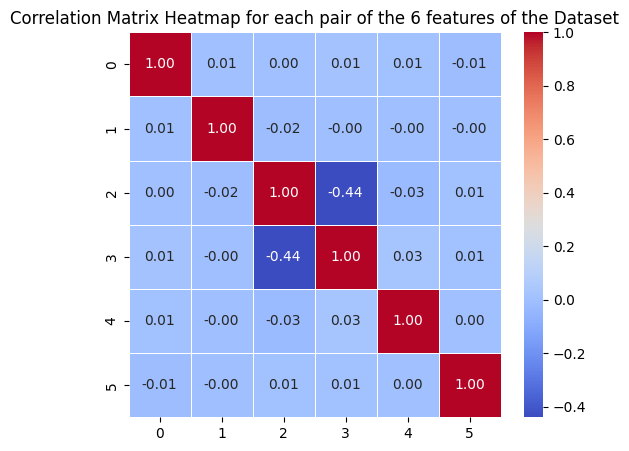

In [33]:
import seaborn as sns

plt.figure(figsize=(6, 5))
sns.heatmap(C, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)

plt.title(f"Correlation Matrix Heatmap for each pair of the {numFeatures} features of the Dataset")
plt.show()

## Variance calculation

In [34]:
feature0_classFalse = normalizedFeatures[0, labels == 0]
feature0_classTrue = normalizedFeatures[0, labels == 1]


print(f"feature0, class false shape: {feature0_classFalse.shape}")
print(f"feature0, class True shape: {feature0_classTrue.shape}")


#Variance for feature0, class True
var0_classFalse = feature0_classFalse.var(0)    #since it's a row vector, writing var(0) is the same as writing var()
var0_classTrue = feature0_classTrue.var(0)


print(f"var feature0 class False: {var0_classFalse}")
print(f"var feature0 class True: {var0_classTrue}")

feature0, class false shape: (2990,)
feature0, class True shape: (3010,)
var feature0 class False: 0.5688171125890537
var feature0 class True: 1.4283151763451152


<ul>
<li> Variance for class False is way smaller because (you can see it on the density histogram!) there's a big part of samples located near the mean (the density in the histogram is the highest) and the tails have lower density. 

<li> Variance for class True is higher because there are fewer samples located near the mean and the tails have higher density.

<ul>

In [35]:
normalizedFeatures[0, labels == 0]

array([-0.21686927, -0.18837042,  1.02371893, ..., -0.67053919,
        1.06423207, -0.47325404], shape=(2990,))

In [36]:
labels==0

array([False,  True, False, ..., False,  True,  True], shape=(6000,))

In [37]:
normalizedFeatures[1, labels == 0]

array([ 1.63296626, -0.35638435,  0.84524502, ...,  1.20630454,
        3.27483355, -0.37653917], shape=(2990,))

In [38]:
def showVariancesForFeaturesByClass():

    for i in range(numFeatures):
        featFalse = normalizedFeatures[i, labels == 0]
        featTrue = normalizedFeatures[i, labels == 1]


        print(f"feature {i}, class False shape: {featFalse.shape}")
        print(f"feature {i}, class True shape: {featTrue.shape}")


        #Variance for feature0, class True
        varFalse = featFalse.var(0)    #since it's a row vector, writing var(0) is the same as writing var()
        varTrue = featTrue.var(0)


        print(f"var feature {i} class False: {varFalse}")
        print(f"var feature {i} class True: {varTrue}")

        print("---"*20)
        print("\n")

In [39]:
showVariancesForFeaturesByClass()

feature 0, class False shape: (2990,)
feature 0, class True shape: (3010,)
var feature 0 class False: 0.5688171125890537
var feature 0 class True: 1.4283151763451152
------------------------------------------------------------


feature 1, class False shape: (2990,)
feature 1, class True shape: (3010,)
var feature 1 class False: 1.4232101676778883
var feature 1 class True: 0.5792320885271494
------------------------------------------------------------


feature 2, class False shape: (2990,)
feature 2, class True shape: (3010,)
var feature 2 class False: 0.5486154735297931
var feature 2 class True: 0.5475437130963902
------------------------------------------------------------


feature 3, class False shape: (2990,)
feature 3, class True shape: (3010,)
var feature 3 class False: 0.5412965429837056
var feature 3 class True: 0.5587661935678022
------------------------------------------------------------


feature 4, class False shape: (2990,)
feature 4, class True shape: (3010,)
var featu

In [40]:
def showVariancesForFeaturesByClass_Table(feature, labels):
    numFeatures = feature.shape[0]  # Numero di feature
    
    # Creiamo una lista per i dati della tabella
    table_data = []

    for i in range(numFeatures):
        featFalse = feature[i, labels == 0]
        featTrue = feature[i, labels == 1]

        varFalse = featFalse.var(0)
        varTrue = featTrue.var(0)

        # Aggiungiamo i dati alla lista
        table_data.append([f"Feature {i}", f"{varFalse:.4f}", f"{varTrue:.4f}"])

    # Creiamo la figura
    fig, ax = plt.subplots(figsize=(6, numFeatures // 2 + 1))
    ax.axis("tight")
    ax.axis("off")

    # Creiamo la tabella
    col_labels = ["Feature", "Var (False)", "Var (True)"]
    table = ax.table(cellText=table_data, colLabels=col_labels, cellLoc='center', loc='center')

    # Renderizziamo la tabella
    plt.show()


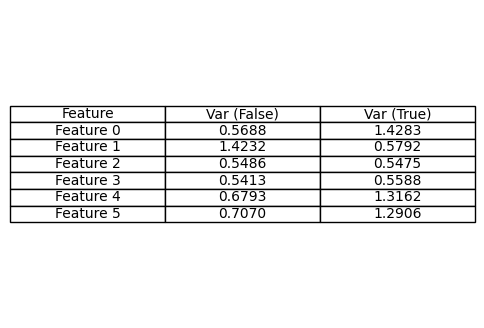

In [41]:
showVariancesForFeaturesByClass_Table(normalizedFeatures, labels)

### Comment on Variances
<ul>

<li> For feature 0: 

<li> For feature 1: Var (False) >> Var (True) because False samples are more concentrated around the mean and the tails have lower densities, whereas True samples are more sparse and less concentrated around the mean.
<li> For feature 2: Var(True) == Var(False) ca because both class samples are distributed in a similar way and are sparse in about the same way. Maybe the feature is not discriminant because its distribution doens't change too much between the 2 different classes??
<li> For feature 3: it's pretty much the same as feature 2.
<li> For feature 4 and 5: Var (True) and Var (False) are very different 

</ul>

### PCA (Principal Component Analysis) application on the dataset

In [42]:
#See pca_functions.py for a more detailed explanation about the functions
from pca_functions import calculatePCA, applyPCA, scatterPlots2

Initially, I apply PCA with m = 6, meaning I retain 6 principal components. In this case, there is no true dimensionality reduction, as the target space still has 6 dimensions, just like the original space. However, the transformation effectively performs a **rotation** of the data. <br>
Having in mind that PCA needs to be applied on *centered data* (in our case x is alredy centered because we've performed the nornalization) the steps to perform PCA are essentially:

1. **Compute the sample covariance matrix**  

  $$
  C = \frac{1}{K} \sum_i (x_i - \bar{x})(x_i - \bar{x})^T = \frac{1}{k} \sum_i z_i z_i^T
  $$

2. **Use the Singular Value Decomposition (SVD) on C and find the matrix U**
  $$
  C = U \Sigma U^T
  $$

3. **U contains the eigenvectors, take just the leading m eigenvectors describing the subspace P**

4. **Apply PCA on the dataset: project the data in the subspace spanned by the m columns of U corresponding to the m highest eigenvalues**

In [43]:
#Apply PCA with m = 6 -> so the number of dimensionalities of the target subspace is 6

#Step 1: calculate PCA on the normalizedFeatures samples
m_pca = 6
P_6 = calculatePCA(x, m=m_pca)


print(f"PCA P Matrix with m = {m_pca}:\n{P_6}")
print(f"P_{m_pca} has a shape of: {P_6.shape}")

PCA P Matrix with m = 6:
[[-0.02251196  0.72314689  0.05855318 -0.19250946 -0.65978322  0.02737728]
 [-0.02400435  0.16932437 -0.76270934 -0.55668717  0.28004785 -0.02645965]
 [ 0.70430566  0.03014386  0.04191228 -0.0465561  -0.00300362 -0.70647841]
 [-0.704194   -0.03052653 -0.00849131  0.04047596 -0.05130126 -0.70628374]
 [-0.08351378  0.28685419  0.62366304 -0.50235915  0.51904729 -0.00312017]
 [-0.00260655 -0.60354121  0.15511822 -0.62997541 -0.4628265   0.02433456]]
P_6 has a shape of: (6, 6)


In [44]:
# Apply the PCA by projecting the samples into the subspace

DP_pca_6 = applyPCA(x, P_6)

print(f"Shape of DP_pca_{m_pca}: {DP_pca_6.shape}") 
print(f"All the features for each of the first 10 samples of the projected samples DP_pca_{m_pca}:\n{DP_pca_6[:, :10]}")

Shape of DP_pca_6: (6, 6000)
All the features for each of the first 10 samples of the projected samples DP_pca_6:
[[ 1.47988401 -1.20097523  0.44934611  0.20937138  3.22040947 -0.28035623
   0.25623079  1.654044   -0.89330965 -0.06549111]
 [ 0.38085141 -0.51137519  0.37779288 -1.74555263 -2.63725815 -0.50519184
   1.4830843  -0.48288373  0.4715273   1.03163825]
 [-0.1593253  -0.86821379  0.01144084 -0.18519493 -0.3306177  -0.52171541
   0.61048503  1.17099711 -0.41753464  1.0793845 ]
 [-0.57315765 -1.72182952  2.04322974  0.52599458  1.11132326  0.94211862
   0.05041929 -1.12700017 -1.11536269  0.14794997]
 [-2.28505055  0.22241648 -0.25346849 -1.03950927 -0.03708263 -0.61157967
   1.05450137 -0.51633414 -0.73015321  1.02028747]
 [-0.03112644 -0.2918966   0.261173   -0.23557539  1.96092619 -0.7651979
  -0.70967023  0.37642415 -0.34289199  0.39298279]]


In [45]:
import plot_functions
from plot_functions import densityHistograms, densityPlots_TR_VAL
import importlib

importlib.reload(plot_functions)

<module 'plot_functions' from 'd:\\MAGISTRALE\\ANNO 1\\Machine Learning and Pattern Recog\\PROJECT\\plot_functions.py'>

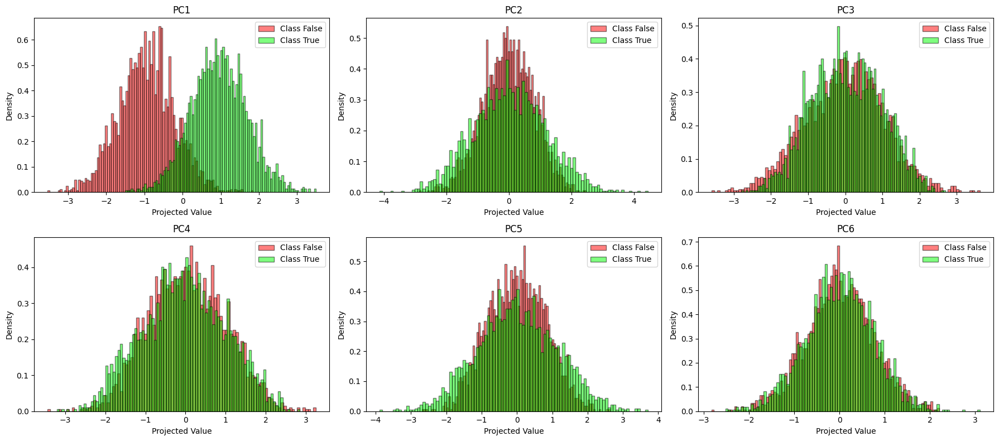

In [46]:
classNames = {0: 'False', 1: 'True'}
labelColors = {0: "red", 1: "#00ff00"}


#X, n_components, y=None,labelColors=None, classNames=None, rows=2, cols=3, bins=30, title=None
densityHistograms(X=DP_pca_6, y=y, n_components=DP_pca_6.shape[0], labelColors=labelColors, rows=2, cols=3, subTitles=["PC1", "PC2", "PC3", "PC4", "PC5", "PC6"], xtitles=["Projected Value"]*6, ytitles=["Density"]*6, classNames=classNames, bins=100)

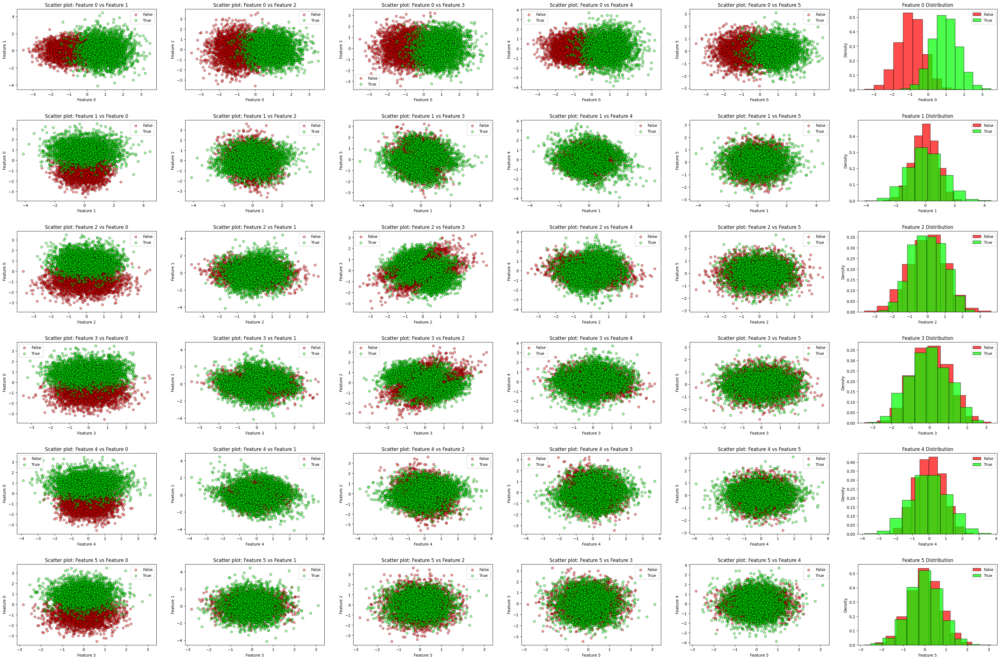

In [47]:
scatterPlots(DP_pca_6, y)

By looking at these charts, it's evident that the PCA-transformed features show different distribution for individual features and different scatter
plots. However, recall that PCA with 6 dimensions corresponds to just a **rotation** of the features. <br>
The classes have **not** become more separated! Just in one case (the first PC) the classes start to be more separated for every feature. <br>
To summarize, I think that just the first Principal Component is useful because the classes here are visibly more separated, although we can do better (there's still a pretty large overlap between -1 and 1)...

### LDA (Linear Discriminant Analysis) application on the dataset

In [48]:
from lda_functions import calculateLDA, calculateLDAbyJointDiagonalization, applyLDA, scatterPlots2

There are two ways of computing the LDA, and they are two different approaches of solving the generalized eigenvalue problem, which is the heart of PCA. <br> <br>

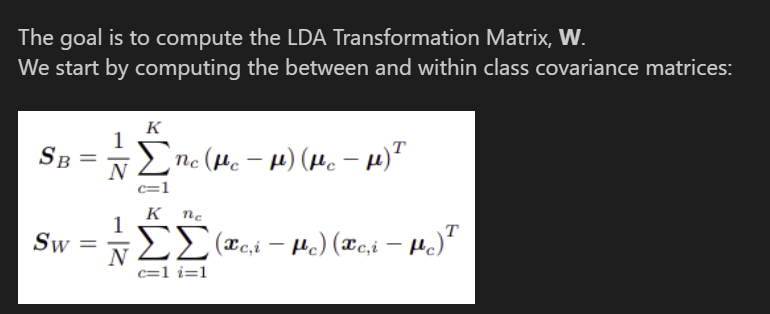 <br>
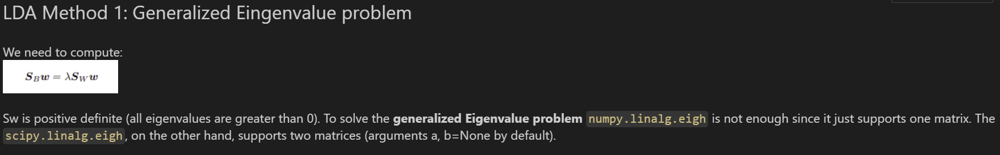 <br>
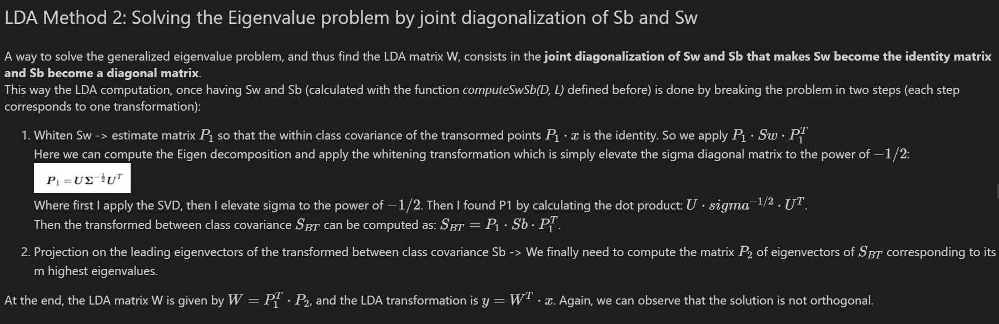

**Since we have just two classes (0 = False, 1 = True) we can compute at most 1 discriminant direction!**

I invert the sign of matrix `W_1_JointDiag` since I wanna have the orientation that results in the projected mean of class True (label 1) being larger than the projected mean of class False (label 0). For the PCA, the sign of the P matrix was already the right one. <br>
The sign inversion is done just for visualization purposes and has no other mathematical meaning.

In [49]:
#Compute PCA, use the Joint Diagonalization Method (using the other method produces the same results despite the signs in certain cases)

m_lda = 1

W_1_JointDiag = calculateLDAbyJointDiagonalization(x, y, m=m_lda)

W_1_JointDiag *=-1 #I invert the sign since I wanna have the orientation that results in the projected mean of class True (label 1) being larger than the projected mean of class False (label 0)

print(f"W_1:\n{W_1_JointDiag}")
print(f"Shape: {W_1_JointDiag.shape}")

W_1:
[[ 0.01064535]
 [-0.01340614]
 [ 0.96686359]
 [-0.9630345 ]
 [-0.02177632]
 [ 0.03284822]]
Shape: (6, 1)


In [50]:
# Apply LDA, so project the samples onto W_1 plane

DP_lda_1 = applyLDA(x, W_1_JointDiag)


print(f"Shape of the LDA Projected samples: {DP_lda_1.shape}")

Shape of the LDA Projected samples: (1, 6000)


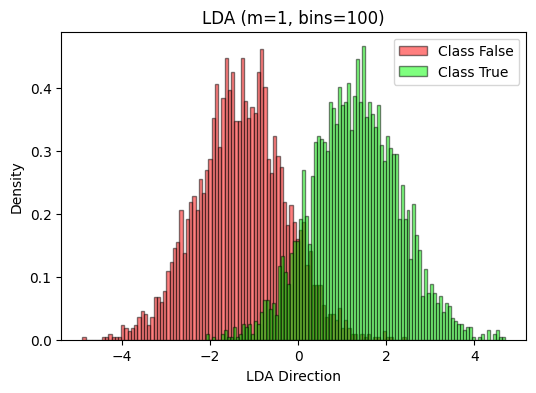

In [51]:
densityHistograms(X=DP_lda_1, y=y, rows=1, cols=1, labelColors=labelColors, n_components=1, bins=100,subTitles=["LDA (m=1, bins=100)"], xtitles=["LDA Direction"], classNames=classNames, ytitles=["Density"] )

### Comparison: PCA with m = 1 versus LDA with m = 1

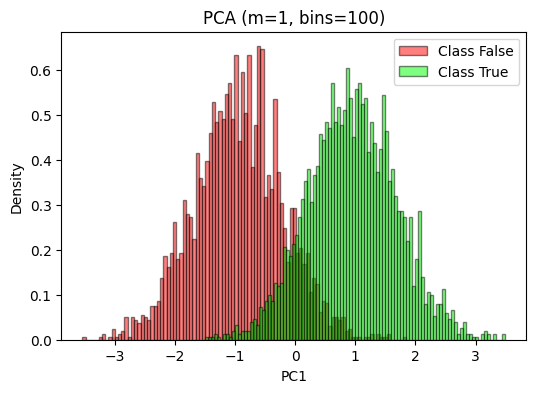

In [52]:
#Compute and apply PCA using m = 1 principal components, so the target subspace no has just 1 dimensions.
m_pca_1 = 1
P_1 = calculatePCA(x, m=m_pca_1)


DP_pca_1 = applyPCA(x, P_1)

densityHistograms(X=DP_pca_1, y=y, rows=1, cols=1, labelColors=labelColors, n_components=1, bins=100,subTitles=["PCA (m=1, bins=100)"], xtitles=["PC1"], classNames=classNames, ytitles=["Density"] )

In this case the LDA with m=1 shows approximately the same result as showed by the first principal component of the PCA. I think that it's because the classes widely overlap in the original dataset and also because the LDA can be limited by the fact that we have just 2 classes so we can have at most 1 discriminant direction.

### Model 1: LDA Classifier 

First of all, we divide the date into the **training samples** that will be used to train the LDA classifier (i.e. the LDA direction will be computed using these data), and into the **validation samples**, data never seen before by the model. Th validation samples will be used to test how well the model performs and generalizes on unseen data.

In [53]:
from train_validation_split import splitTrainingValidation

In [54]:
# Train validation split
percentageTraining = 2.0 / 3.0 #this mean 2/3 of data will be used for training, whereas 1/3 will be used fo validation

(DTR, LTR), (DVAL, LVAL) = splitTrainingValidation(percentageTraining, x, y)


In [55]:
print(f"Shape of training DTR, LTR: {DTR.shape}, {LTR.shape}")
print(f"Shape of validation DVAL, LVAL: {DVAL.shape}, {LVAL.shape}\n")

print("Class labels in training set:", np.unique(LTR))
print("Class labels in validation set:", np.unique(LVAL))

Shape of training DTR, LTR: (6, 4000), (4000,)
Shape of validation DVAL, LVAL: (6, 2000), (2000,)

Class labels in training set: [0 1]
Class labels in validation set: [0 1]


Now I have to compute the LDA W Matrix on just the training samples:

In [56]:
m_lda = 1

W_1_JointDiag_model1 = calculateLDAbyJointDiagonalization(DTR, LTR, m=m_lda)

W_1_JointDiag_model1 *=-1 #I invert the sign since I wanna have the orientation that results in the projected mean of class True (label 1) being larger than the projected mean of class False (label 0)

print(f"W_1:\n{W_1_JointDiag_model1}")
print(f"Shape: {W_1_JointDiag_model1.shape}")

W_1:
[[ 0.00634306]
 [-0.01017291]
 [ 0.94878885]
 [-0.9618512 ]
 [-0.02187117]
 [ 0.03808485]]
Shape: (6, 1)


Now I project the validation samples. I also project the training samples to plot the two results and confront them.

In [57]:
# Apply the LDA -> Project the VALIDATION samples (DVAL)
DVAL_lda_model1 = applyLDA(DVAL, W_1_JointDiag_model1)

print(f"DVAL Projected (first 10 samples):\n {DVAL_lda_model1[0, :10]}")
print(f"Shape of the full DVAL Projected: {DVAL_lda_model1.shape}")

DVAL Projected (first 10 samples):
 [-1.86289435 -0.48393853  2.53455116 -1.02893597 -1.46240533  0.69929151
 -1.73815661 -0.71317716 -2.12211436 -1.48068045]
Shape of the full DVAL Projected: (1, 2000)


In [58]:
# Apply the LDA -> Project the TRAINING samples (DTR)
DTR_lda_model1 = applyLDA(DTR, W_1_JointDiag_model1)

print(f"DVAL Projected (first 10 samples):\n {DTR_lda_model1[0, :10]}")
print(f"Shape of the full DTR Projected: {DTR_lda_model1.shape}")

DVAL Projected (first 10 samples):
 [ 1.29450450e+00 -2.34974700e-01 -1.50968295e-02  4.52917611e-01
 -7.35302685e-01 -8.39822045e-02  8.00898027e-01  9.32769909e-01
  8.30767868e-01  1.01950791e-03]
Shape of the full DTR Projected: (1, 4000)


So, to recap:
1. LDA was calculated on just the *training* samples, DTR and LTR
2. Then I apply the model on the *validation* samples, DVAL and LVAL
3. I also apply the model on the training samples to plot the two results and confront them

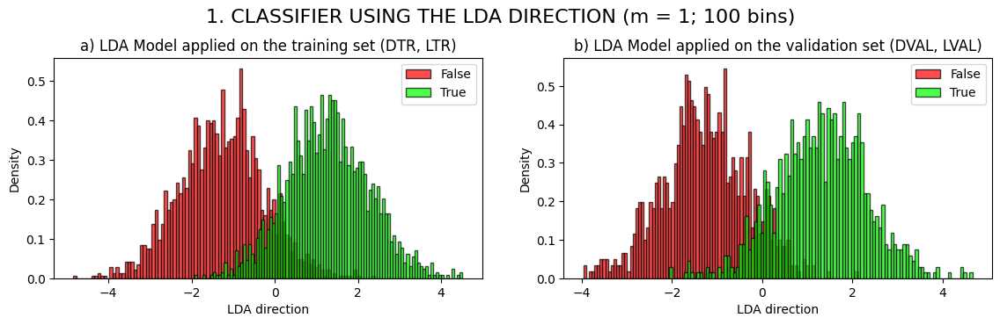

In [59]:
classNames = {0: 'False', 1: 'True'}
labelColors = {0: "red", 1: "#00ff00"}



densityPlots_TR_VAL(DTR_lda_model1, LTR, DVAL_lda_model1, LVAL, title1="a) LDA Model applied on the training set (DTR, LTR)", bins1=100, title2="b) LDA Model applied on the validation set (DVAL, LVAL)", bins2=100, title="1. CLASSIFIER USING THE LDA DIRECTION (m = 1; 100 bins)", labelColors=labelColors, classLabels=classNames, rows=1, cols=2)

In [60]:
print(f"Mean of the class 0 (False) of training samples over the LDA direction: {DTR_lda_model1[0,LTR==0].mean()}")  #Mean of the class 0 of training samples

print(f"Mean of the class 1 (True) of training samples over the LDA direction: {DTR_lda_model1[0,LTR==1].mean()}\n\n")  #Mean of the class 1 of training samples


print(f"Mean of the class 0 (False) of validation samples over the LDA direction: {DVAL_lda_model1[0,LVAL==0].mean()}")  #Mean of the class 0 of validation samples

print(f"Mean of the class 1 (True) of validation samples over the LDA direction: {DVAL_lda_model1[0,LVAL==1].mean()}")  #Mean of the class 1 of validation samples


Mean of the class 0 (False) of training samples over the LDA direction: -1.2916775570304249
Mean of the class 1 (True) of training samples over the LDA direction: 1.2664342492741714


Mean of the class 0 (False) of validation samples over the LDA direction: -1.2828833816285379
Mean of the class 1 (True) of validation samples over the LDA direction: 1.3075304627732216


Since the LDA direction is defined up to its sign, in order to perform classification we need
to fix the orientation and choose a threshold, so that we can properly label samples above and below
the selected threshold. In the following we choose the orientation that results in the class 1 (True) 
being on the right of the plot, i.e., in the mean of the projected samples of the class True being
higher than the mean of the projected samples of the class False.

To choose the threshold, for the moment we simply employ the mean of the
projected class means, *computed on the model training data*:

In [61]:
#Since the projected samples have only one dimension, we can calculate the mean of the mean of the 2 classes simply like this (without a for loop):
threshold_model1 = (DTR_lda_model1[0, LTR==0].mean() + DTR_lda_model1[0, LTR==1].mean()) / 2.0

print(f"Selected threshold is: {threshold_model1}")

Selected threshold is: -0.012621653878126748


In order to build the proper classifier rule, we simply compare each projected sample to the threshold:
- elements located at the right of the threshold -> classified as **class 1** (True)
- elements located at the left of the threshold -> classified as **class 0** (False)

**The classification is applied JUST on the validation samples**. Since the model was trained using the training samples, we apply the classification rule to the validation samples which are data that the model has **never seen** before.

In [62]:
#Build the model rule and apply it JUST on the VALIDATION SAMPLES

#Build an array to contain the predicted results, havinh shape equal to LVAL (34, )
#At the begoinning it's preallocated with all zero
#Later on it will store just 1 (class 1) or 2 (class 2)
PVAL_model1 = np.zeros(shape=LVAL.shape, dtype=np.int32)

#Classification rule:
#- elements located at the right of the threshold -> classified as **class 1** (True)
#- elements located at the left of the threshold -> classified as **class 0** (False)

PVAL_model1[DVAL_lda_model1[0] >= threshold_model1] = 1   #AT THE RIGHT OF THRESHOLD -> CLASS 1 TRUE
PVAL_model1[DVAL_lda_model1[0] < threshold_model1] = 0   #AT THE LEFT OF THRESHOLD -> CLASS 0 FALSE

Model 1 Evaluation:

Error Rate:

In [63]:
#Confront the predictions to teh actual classes:

error_count_model1 = np.count_nonzero(PVAL_model1 != LVAL)
print(f"Number of wrong predictions: {error_count_model1}")
error_rate_model1 = np.mean(PVAL_model1 != LVAL)
print(f"Error Rate: {error_rate_model1:.2%}")

Number of wrong predictions: 186
Error Rate: 9.30%


Accuracy, Precision, Recall, F-1 Score for Model 1:

In [64]:
from sklearn.metrics import classification_report

print(classification_report(LVAL, PVAL_model1, digits=3))

              precision    recall  f1-score   support

           0      0.907     0.905     0.906       992
           1      0.907     0.909     0.908      1008

    accuracy                          0.907      2000
   macro avg      0.907     0.907     0.907      2000
weighted avg      0.907     0.907     0.907      2000



Overall performances are not perfect but above average I would say. 
The most important limit of this model is the fact that, as observed in the density charts, two tails of the classes overlap so in that range (near the threshold which is slightly above zero) the model surely makes classification errors.

A technique that can be used to fine tune the model is to choose a better threshold. <br>
A simple brute force approach is to rely on a **Grid Search**: as seen in the density charts, the proper threshold needs to be in the *neighbourhood* of the threshold calculated before uaing the mean of the two classes means of the training samples. So, I can define a neighbourhood centered in the previous threshold having a certain appropriate radius and apply the Grid Search on this interval. <br>
Regarding the scoring metric used to fine tune the threshold, I need to decide by looking at how well the training dataset are balanced among the two classes:

In [65]:
cardinalityClass0 = DTR_lda_model1[0, LTR == 0].shape[0] #here shape[0] is equal to shape since DTR_lda_model1[0, LTR == 0] is single-dimensional

cardinalityClass1 = DTR_lda_model1[0, LTR == 1].shape[0]

print(f"Cardinality of class 0 (False): {cardinalityClass0}")
print(f"Cardinality of class 1 (True): {cardinalityClass1}")

Cardinality of class 0 (False): 1998
Cardinality of class 1 (True): 2002


### Threshold Optimization with F-1 Score and GridSearch
Since the dataset is balanced, the easiest way would be using the **accuracy** as the score metric. However, I fell that using the **F-1 Score** would be a valid alternative (which works also with unbalanced datasets, whereas accuracy doesn't perform well in such cases) and would be useful for limiting false positives and false negatives. <br>
The F-1 Score is the harmonic mean of precision and recall. This metric balances the importance of precision and recall. <br> When precision and recall both have perfect scores of 1.0, F-1 will also have a perfect score of 1.0. <br>
The **F-1 Score** is computed as such:
$$
F1 = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}
$$

Where:
- **Precision**: the fraction of predicted positive samples that are actually positive  
  $$
  \text{Precision} = \frac{TP}{TP + FP}
  $$
- **Recall**: the fraction of actual positive samples correctly classified  
  $$
  \text{Recall} = \frac{TP}{TP + FN}
  $$

Where:
- \( TP \) = True Positives  
- \( FP \) = False Positives  
- \( FN \) = False Negatives


In [66]:
from sklearn.metrics import accuracy_score, f1_score

In [67]:
def gridSearch(center, radius, xVAL, yVAL, num=100, scoringFunction = f1_score):

    #Compute the linspace of all the thresholds to be tested, spanning from center - radius to center + radius
    #So the thresholds interval is [center - radius; center + radius]
    #num tell how to divide this interval. If num is higher, this interval will be partitioned in more thresholds
    thresholds = np.linspace(center - radius, center + radius, num=num)


    bestThreshold = None       #the best threshold to be chosen among all the thresholds composing the linspace
    bestScore = -np.inf        #the best score in terms of the metric computed at every iteration, for each threshold
    bestPredictions = None     #the best PVAL_model1 predicted

    for t in thresholds:

        #Apply the classification rule at every iteration and test the threshold t
        PVAL_gs = np.zeros(shape=yVAL.shape, dtype=np.int32)

        #Classification rule:
        #- elements located at the right of the threshold -> classified as **class 1** (True)
        #- elements located at the left of the threshold -> classified as **class 0** (False)

        PVAL_gs[xVAL[0] >= t] = 1   #AT THE RIGHT OF THRESHOLD -> CLASS 1 TRUE
        PVAL_gs[xVAL[0] < t] = 0   #AT THE LEFT OF THRESHOLD -> CLASS 0 FALSE

        #Compute the desired metric and use it for assigning a score to the threshold t
        #the sintax is always "scoringFunction(ytrue, ypred)"
        score = scoringFunction(yVAL, PVAL_gs)

        #if the score is better then the best one, update the overall best score
        if score > bestScore:
            bestScore = score
            bestThreshold = t
            bestPredictions = PVAL_gs


    #return the best threshold, i.e. the threshold achieving the best score
    #return also the related predictions (so we don't have to fit the model again on the best threshold)
    return bestThreshold, bestPredictions


In [68]:
threshold_model1_gs, PVAL_model1_gs = gridSearch(center=threshold_model1, radius=4, xVAL=DVAL_lda_model1, yVAL=LVAL, scoringFunction=f1_score, num=10000)

print(f"Grid Search found the best threshold according to the specified interval having radius=4: {threshold_model1_gs}")

Grid Search found the best threshold according to the specified interval having radius=4: -0.09943033474621377


In [69]:
#This may take long, comment it out if you don't want to repeat this GridSearch
'''
radiusIterations = []
for r in [0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]:
    threshold_model1_gs_iterations, PVAL_model1_gs_iterations = gridSearch(center=threshold_model1, radius=r, xVAL=DVAL_lda_model1, yVAL=LVAL, scoringFunction=f1_score, num=10000)
    radiusIterations.append((threshold_model1_gs_iterations, PVAL_model1_gs_iterations))

    print(f"Grid Search found the best threshold according to the specified interval having radius={r}: {threshold_model1_gs_iterations}")'
'''

'\nradiusIterations = []\nfor r in [0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4]:\n    threshold_model1_gs_iterations, PVAL_model1_gs_iterations = gridSearch(center=threshold_model1, radius=r, xVAL=DVAL_lda_model1, yVAL=LVAL, scoringFunction=f1_score, num=10000)\n    radiusIterations.append((threshold_model1_gs_iterations, PVAL_model1_gs_iterations))\n\n    print(f"Grid Search found the best threshold according to the specified interval having radius={r}: {threshold_model1_gs_iterations}")\'\n'

Let's use `threshold_model1_gs` = -0.09943033474621377 (radius = 4). I already have the predictions (`PVAL_model1_gs`) so I can evaluate the model:

Model 1 + F1-Score and GridSearch Evaluation:

Error Rate:

In [70]:
#Confront the predictions to teh actual classes:

error_count_model1_gs = np.count_nonzero(PVAL_model1_gs != LVAL)
print(f"Number of wrong predictions: {error_count_model1_gs}")
error_rate_model1_gs = np.mean(PVAL_model1_gs != LVAL)
print(f"Error Rate: {error_rate_model1_gs:.2%}")

Number of wrong predictions: 181
Error Rate: 9.05%


Accuracy, Precision, Recall, F-1 Score for the Model 1 + F-1 Score and GridSearch:

In [71]:
print(classification_report(LVAL, PVAL_model1_gs, digits=3))

              precision    recall  f1-score   support

           0      0.921     0.894     0.907       992
           1      0.899     0.925     0.911      1008

    accuracy                          0.909      2000
   macro avg      0.910     0.909     0.909      2000
weighted avg      0.910     0.909     0.909      2000



### Another way for Threshold Optimization: ROC-AUC + Youden Index

The **Receiver Operating Characteristic (ROC) curve** is a plot that shows the performance of a classification model at different threshold values. It is created by plotting:

- **True Positive Rate (TPR)** (Sensitivity/Recall) vs. **False Positive Rate (FPR)** <br>

Where:
$$
TPR = \frac{TP}{TP + FN} = \text{Recall}
$$

$$
FPR = \frac{FP}{FP + TN}
$$

The **Area Under the Curve (AUC)** represents the overall model performance. A perfect model has an AUC of **1.0**, while a random classifier has an AUC of **0.5**.

The **Youden Index** is used to find the optimal classification threshold by maximizing the difference between **TPR** and **FPR**:

$$
J = TPR - FPR
$$

The best threshold \( t^* \) is the one that maximizes \( J \):

$$
t^* = \arg\max (TPR - FPR)
$$

This threshold provides the best trade-off between correctly identifying positives while minimizing false positives.

#### Comparison with F1-Score:

| **Method** | **Goal** | **Best for** | **Limitations** |
|------------|---------|-------------|----------------|
| **F1-Score** | Balances **Precision** and **Recall** | When **false positives and false negatives are equally important** | Does not consider **true negatives** |
| **Youden Index (ROC-AUC)** | Maximizes **TPR - FPR** | When **you need an optimal threshold based on sensitivity & specificity** | Can be misleading if **costs of false positives and false negatives differ** |



In [72]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(LVAL, DVAL_lda_model1[0])
youden_index = tpr - fpr
threshold_model1_yi = thresholds[np.argmax(youden_index)]

print(f"Threshold selected: {threshold_model1_yi}")

Threshold selected: -0.09913011385193729


In [73]:
#Build the model rule and apply it JUST on the VALIDATION SAMPLES

#Build an array to contain the predicted results, havinh shape equal to LVAL (34, )
#At the begoinning it's preallocated with all zero
#Later on it will store just 1 (class 1) or 2 (class 2)
PVAL_model1_yi = np.zeros(shape=LVAL.shape, dtype=np.int32)

#Classification rule:
#- elements located at the right of the threshold -> classified as **class 1** (True)
#- elements located at the left of the threshold -> classified as **class 0** (False)

PVAL_model1_yi[DVAL_lda_model1[0] >= threshold_model1] = 1   #AT THE RIGHT OF THRESHOLD -> CLASS 1 TRUE
PVAL_model1_yi[DVAL_lda_model1[0] < threshold_model1] = 0   #AT THE LEFT OF THRESHOLD -> CLASS 0 FALSE

Model 1 + ROC_AUC and Youndex Index:

Error Rate:

In [74]:
#Confront the predictions to teh actual classes:

error_count_model1_yi = np.count_nonzero(PVAL_model1_yi != LVAL)
print(f"Number of wrong predictions: {error_count_model1_yi}")
error_rate_model1_yi = np.mean(PVAL_model1_yi != LVAL)
print(f"Error Rate: {error_rate_model1_yi:.2%}")

Number of wrong predictions: 186
Error Rate: 9.30%


Accuracy, Precision, Recall, F-1 Score for the Model 1 + ROC_AUC and Youndex Index:

In [75]:
print(classification_report(LVAL, PVAL_model1_yi, digits=3))

              precision    recall  f1-score   support

           0      0.907     0.905     0.906       992
           1      0.907     0.909     0.908      1008

    accuracy                          0.907      2000
   macro avg      0.907     0.907     0.907      2000
weighted avg      0.907     0.907     0.907      2000



At the end, the Model 1 + F-1 Score and GridSearch achieves the **lowest** error rate, equal to 9.05% (181 wrong predicitions over 2000).
Model 1 + ROC-AUC and Youndex Index achieves an error rate of 9.30% (186 wrong predicitions over 2000), the same as Model 1 without Threshold Optimization techniques applied.

### Model 2: Pipelined Model featuring PCA + LDA

I preprocess the dataset using PCA to take the components maximizing variance, then I apply LDA to take the most discriminant direction. <br>
As always, the full pipelined model is trained on the *training samples* (DTR, LTR) and tested on the *validation samples* (DVAL, LVAL). <br>
This approach follows the pipeline pictured below: <br> <br>
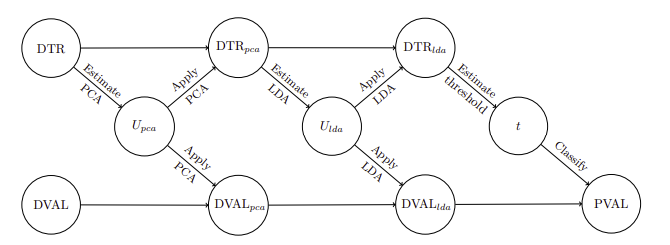

Obvsiously (since we have just two classes) LDA will ha m fixed at 1, no matter what. <br>
Regarding PCA, since I don't know how to select the best to m to improve model performance, I can try with m = 6 (no dimensionality reduction, just a rotation), m = 5, m = 4, m = 3, m = 2.

In [81]:
def buildPipeline_PCA_LDA(DTR, LTR, DVAL, LVAL, originalDimensions, labelColors = None, classLabels = None ):

    #Step 1: try PCA with different m 
    #Step 2: use LDA on that DTR, DVAL data found in step 1
    #Step 3: build and fit the classifier using the classiification rule and threshold

    models = {}

    for m_pca_pip in range(2, originalDimensions + 1):

        #compute PCA P Matrix 
        P_i_pip = calculatePCA(DTR, m=m_pca_pip)

        # Apply the PCA -> Project the VALIDATION samples
        DVAL_pca_i_pip = applyPCA(DVAL, P_i_pip)

        # Apply the PCA -> Project the TRAINING samples
        DTR_pca_i_pip = applyPCA(DTR, P_i_pip)

        densityPlots_TR_VAL(DTR_pca_i_pip, LTR, DVAL_pca_i_pip, LVAL, title1="a) PCA Model applied on the training set (DTR, LTR)", bins1=100, title2="b) PCA Model applied on the validation set (DVAL, LVAL)", bins2=100, title=f"2. PIPELINED CLASSIFIER PCA+LDA: PCA STEP (m = {m_pca_pip}; 100 bins)", xlabel = "PCA Principal Components", labelColors=labelColors, classLabels=classLabels, rows=m_pca_pip, cols=2)

        #Compute the LDA W Matrix
        #Use the Joint Diagonalization Method (using the standard method is the same)
        W_1_JointDiag_i_pip = calculateLDAbyJointDiagonalization(DTR_pca_i_pip, LTR, m=1)

        #I invert the sign since I wanna have the orientation that results in the projected mean of class True (label 1) being larger than the projected mean of class False (label 0)
        W_1_JointDiag_i_pip *= -1 

        # Apply the LDA -> Project the VALIDATION samples DVAL_pca_i_pip obtained with PCA (Pipeline Step 1)
        DVAL_lda_i_pip = applyLDA(DVAL_pca_i_pip, W_1_JointDiag_i_pip)

        # Apply the LDA -> Project the TRAINING samples DTR_pca_i_pip obtained with PCA (Pipeline Step 1)
        DTR_lda_i_pip = applyLDA(DTR_pca_i_pip, W_1_JointDiag_i_pip)

        densityPlots_TR_VAL(DTR_lda_i_pip, LTR, DVAL_lda_i_pip, LVAL, title1="a) LDA Model applied on the training set (DTR, LTR)", bins1=100, title2="b) LDA Model applied on the validation set (DVAL, LVAL)", bins2=100, title=f"2. PIPELINED CLASSIFIER PCA+LDA: LDA STEP (m = 1; 100 bins)", xlabel = "LDA Direction", labelColors=labelColors, classLabels=classLabels, rows=1, cols=2)
        

        #Build the classifier
        #Since the projected samples have only one dimension, we can calculate the mean of the mean of the 2 classes simply like this (without a for loop):
        threshold_i_pip = (DTR_lda_i_pip[0, LTR==0].mean() + DVAL_lda_i_pip[0, LVAL==1].mean()) / 2.0

        #Build the model rule and apply it JUST on the VALIDATION SAMPLES

        #Build an array to contain the predicted results, havinh shape equal to LVAL 
        #At the begoinning it's preallocated with all zero
        #Later on it will store just 0 (class False) or 1 (class True)
        PVAL_i_pip = np.zeros(shape=LVAL.shape, dtype=np.int32)

        #Classification rule:
        #- elements located at the right of the threshold -> classified as **class 1** (True)
        #- elements located at the left of the threshold -> classified as **class 0** (False)

        PVAL_i_pip[DVAL_lda_i_pip[0] >= threshold_i_pip] = 1   #AT THE RIGHT OF THRESHOLD -> CLASS 1 TRUE
        PVAL_i_pip[DVAL_lda_i_pip[0] < threshold_i_pip] = 0   #AT THE LEFT OF THRESHOLD -> CLASS 0 FALSE


        #Evaluate the model
        #Confront the predictions to teh actual classes:
        #Error Count, Error Rate
        error_count_i_pip = np.count_nonzero(PVAL_i_pip != LVAL)
        print(f"Number of wrong predictions for pip model having m_pca={m_pca_pip}: {error_count_i_pip}")
        error_rate_i_pip = np.mean(PVAL_i_pip != LVAL)
        print(f"Error Rate for pip model having m_pca={m_pca_pip}: {error_rate_i_pip:.2%}")

        #Classification Report
        clReport_i_pip = classification_report(LVAL, PVAL_i_pip, digits=3)
        print(f"Classification Report for pip model having m_pca={m_pca_pip}:\n{clReport_i_pip}")

        #Save the Model
        #Sintax:
        #{key: m_pca_pip, value: (predictions PVAL_i_pip, [evaluation metrics...])}
        models[m_pca_pip] = (PVAL_i_pip, [(DTR_pca_i_pip, DVAL_pca_i_pip), (DTR_lda_i_pip, DVAL_lda_i_pip)], [error_count_i_pip, error_rate_i_pip, clReport_i_pip])

    return models
        



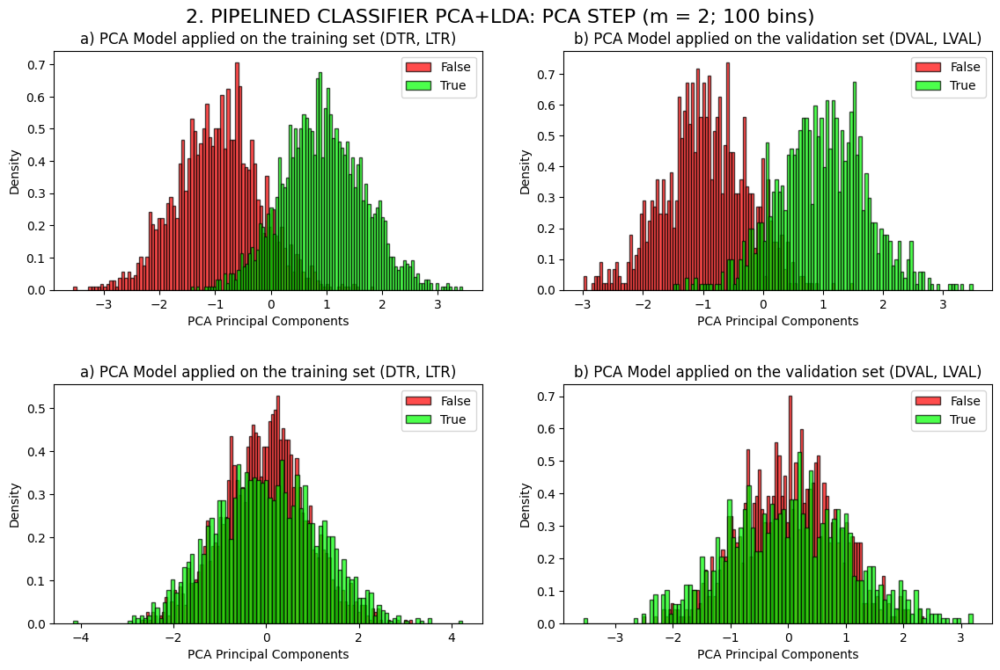

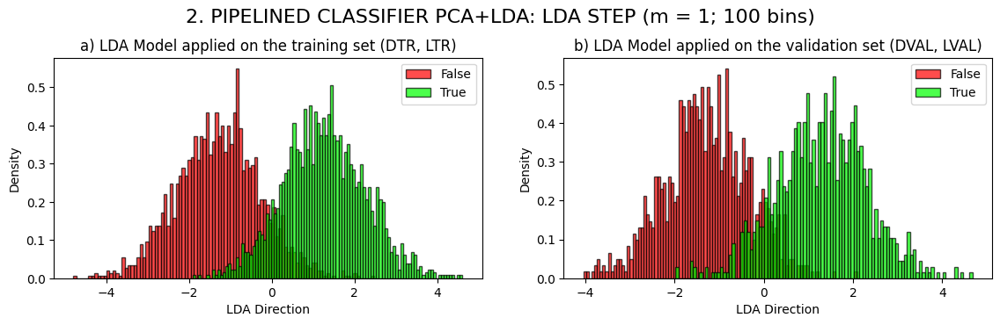

Number of wrong predictions for pip model having m_pca=2: 183
Error Rate for pip model having m_pca=2: 9.15%
Classification Report for pip model having m_pca=2:
              precision    recall  f1-score   support

           0      0.906     0.910     0.908       992
           1      0.911     0.907     0.909      1008

    accuracy                          0.908      2000
   macro avg      0.908     0.909     0.908      2000
weighted avg      0.909     0.908     0.909      2000



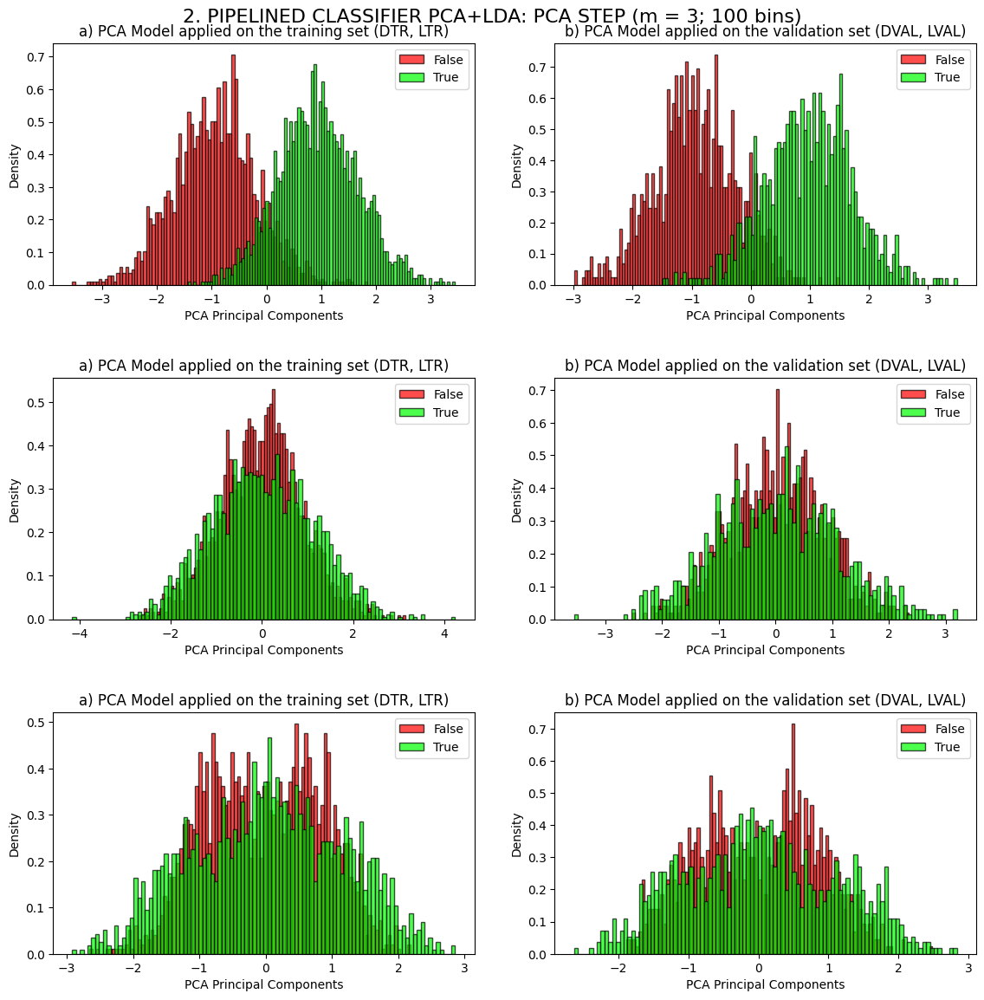

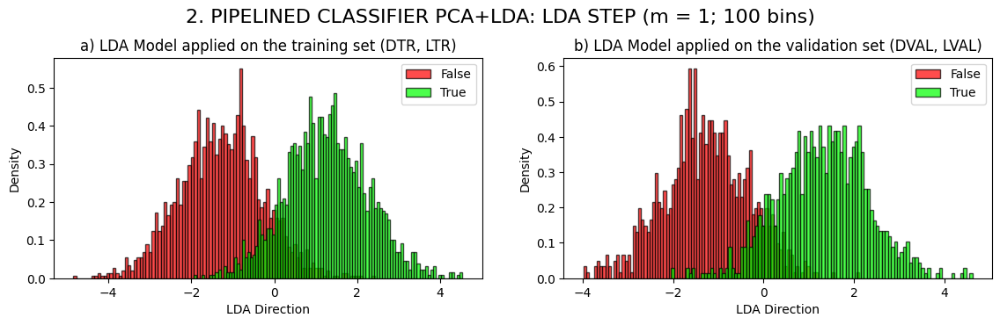

Number of wrong predictions for pip model having m_pca=3: 184
Error Rate for pip model having m_pca=3: 9.20%
Classification Report for pip model having m_pca=3:
              precision    recall  f1-score   support

           0      0.906     0.909     0.907       992
           1      0.910     0.907     0.909      1008

    accuracy                          0.908      2000
   macro avg      0.908     0.908     0.908      2000
weighted avg      0.908     0.908     0.908      2000



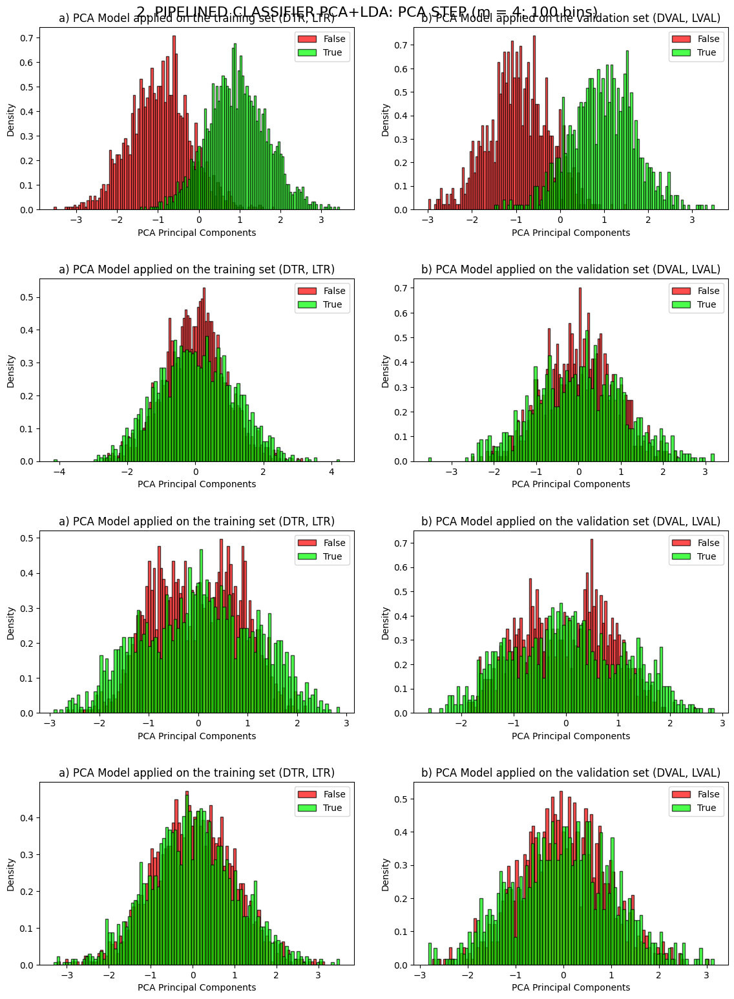

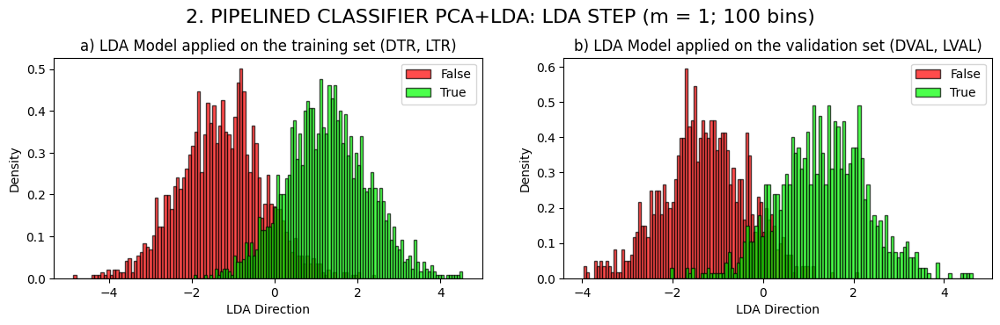

Number of wrong predictions for pip model having m_pca=4: 185
Error Rate for pip model having m_pca=4: 9.25%
Classification Report for pip model having m_pca=4:
              precision    recall  f1-score   support

           0      0.905     0.909     0.907       992
           1      0.910     0.906     0.908      1008

    accuracy                          0.907      2000
   macro avg      0.907     0.908     0.907      2000
weighted avg      0.908     0.907     0.908      2000



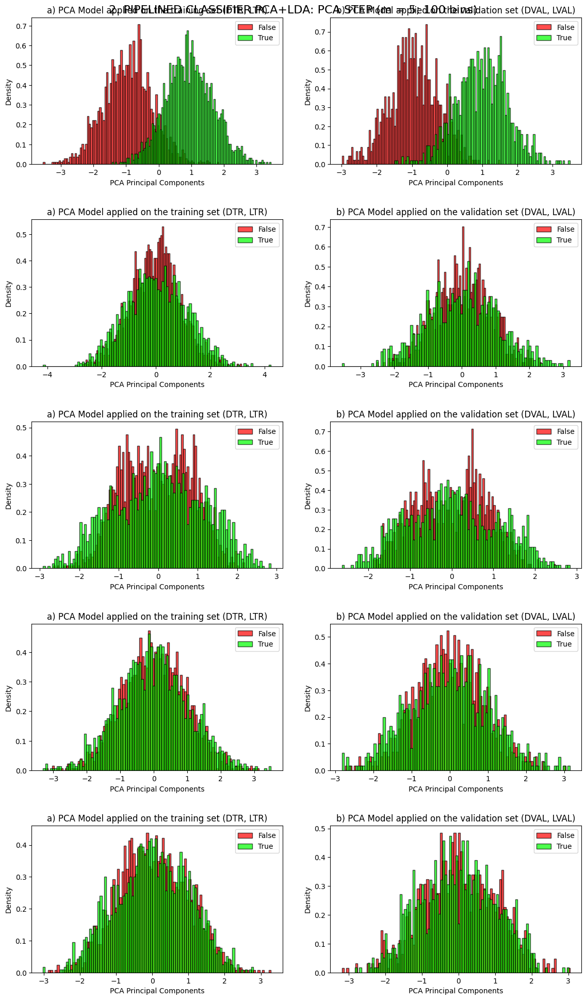

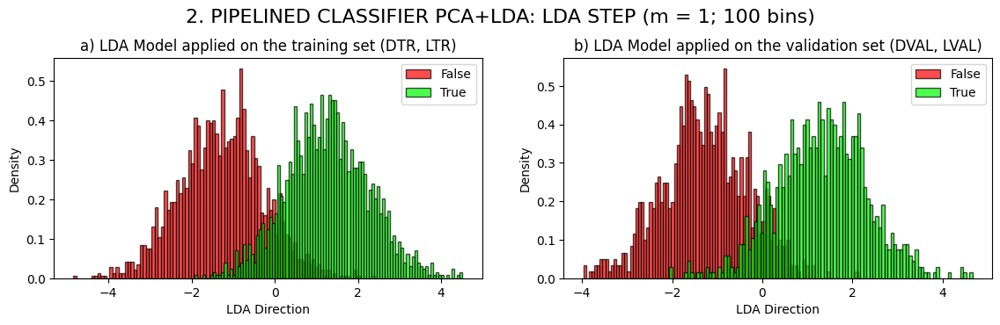

Number of wrong predictions for pip model having m_pca=5: 186
Error Rate for pip model having m_pca=5: 9.30%
Classification Report for pip model having m_pca=5:
              precision    recall  f1-score   support

           0      0.905     0.908     0.906       992
           1      0.909     0.906     0.908      1008

    accuracy                          0.907      2000
   macro avg      0.907     0.907     0.907      2000
weighted avg      0.907     0.907     0.907      2000



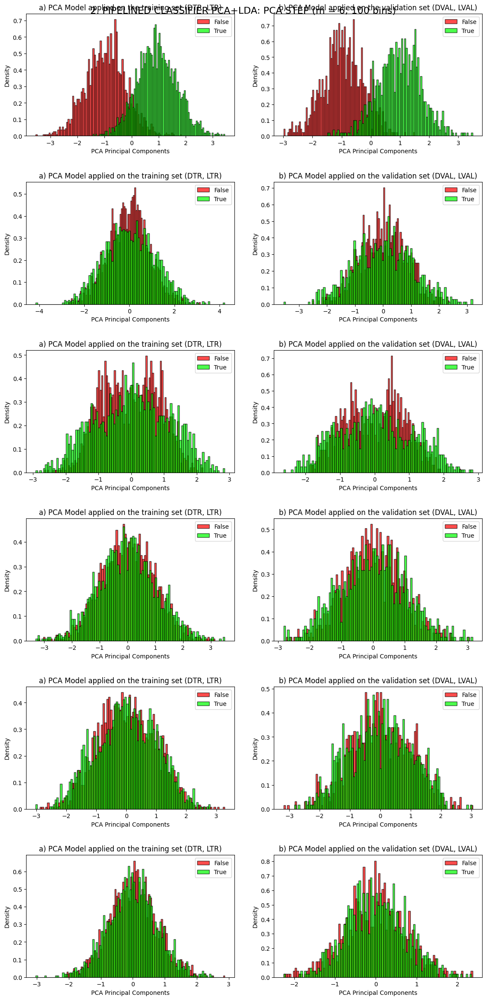

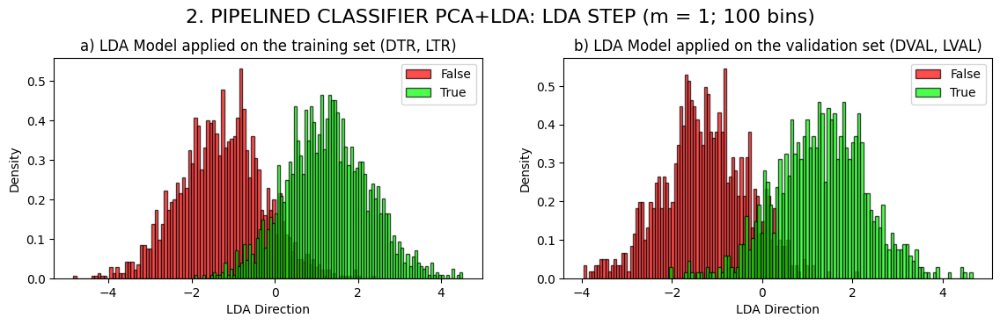

Number of wrong predictions for pip model having m_pca=6: 186
Error Rate for pip model having m_pca=6: 9.30%
Classification Report for pip model having m_pca=6:
              precision    recall  f1-score   support

           0      0.905     0.908     0.906       992
           1      0.909     0.906     0.908      1008

    accuracy                          0.907      2000
   macro avg      0.907     0.907     0.907      2000
weighted avg      0.907     0.907     0.907      2000



In [82]:
#Train and test different classifier using PCA+LDA and different m_pca

models_pip_PCA_LDA = buildPipeline_PCA_LDA(DTR, LTR, DVAL, LVAL, DTR.shape[0],labelColors, classLabels=classNames )

Now, we measure the performance (expressed in this case in terms of error rate (%)) as a function of the number of PCA dimensions `m_pca_pip`.

In [78]:
def linePlot_pip(models_pip_PCA_LDA):

    #Line plot
    #-x axis: m_pca_pip
    #-y axis: error rate


    #models_pip_PCA_LDA -> models[m_pca_pip] = (PVAL_i_pip, [error_count_i_pip, error_rate_i_pip, clReport_i_pip])

    yAxis = [model[1][1] * 100 for model in models_pip_PCA_LDA.values()]
    xAxis = models_pip_PCA_LDA.keys()


    plt.figure(figsize=(8, 5))  
    plt.plot(xAxis, yAxis, marker='o', linestyle='-', color='b', label="Line Plot")  


    plt.ylabel("Error Rate (%)")
    plt.xlabel("Value of m_pca_pip")
    plt.title("Error Rate (%) as a function of the number of PCA dimensions of the pipelined models")


    plt.grid(True)  
    plt.show()

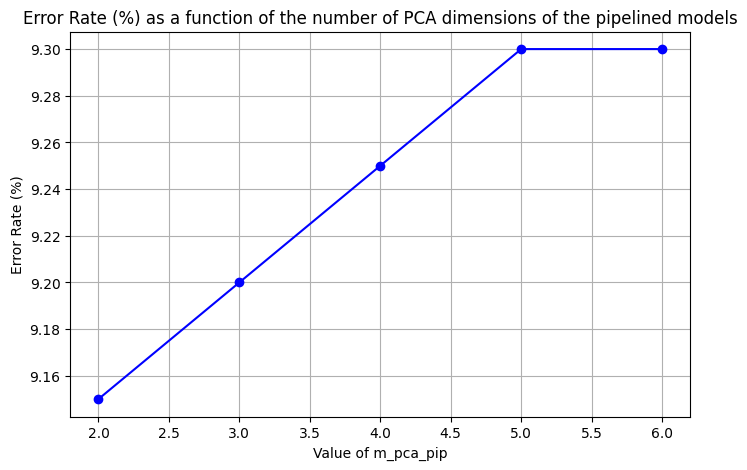

In [79]:
linePlot_pip(models_pip_PCA_LDA)

- **Result**: low values of `m_pca_pip` lead to a lower Error Rate (%), although the difference is very very small! <br>
As a matter of fact, **PCA here doesn't add value to the model**, since the pipelined models (no matter which `m_pca_pip` is chosen) perform roughly the same as Model 1 built on just LDA. <br>

- **Conclusion**: PCA is **NOT** beneficial for the task when combined with the LDA classifier

### Grid Search on the Pipelined Model PCA + LDA

In [ ]:
#Calculate base threshold for pipelined model

#Choose model with m_pca = 2


threshold_model1 = (DTR_lda_model1[0, LTR==0].mean() + DTR_lda_model1[0, LTR==1].mean()) / 2.0

print(f"Selected threshold is: {threshold_model1}")

In [ ]:
threshold_model1_gs, PVAL_model1_gs = gridSearch(center=threshold_model1, radius=4, xVAL=DVAL_lda_model1, yVAL=LVAL, scoringFunction=f1_score, num=10000)

print(f"Grid Search found the best threshold according to the specified interval having radius=4: {threshold_model1_gs}")